In [1]:
import os
import velodyne_decoder as vd
import pandas as pd
import numpy as np
import csv
import datetime
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import plotly.offline as pof
import twd97

from datetime import datetime
from csv import reader
from Transformation import *
from pcap import *
from manual_info import *
from mpl_toolkits import mplot3d

# no scientific notation in jupyter nb
np.set_printoptions(suppress=True,   precision=10,  threshold=2000,  linewidth=150)  
pd.set_option('display.float_format',lambda x : '%.6f' % x)


Read PCAP file
/
Read Lidar frame

In [2]:
# pcap_file = '/home/irene/DG-venv-3.7/data/20230709_NCKU_VLP16/library-VLP16/2023-07-09-18-53-15_Velodyne-VLP-16-Data.pcap'
pcap_frame_file = '/home/irene/DG-venv-3.7/output_pcap_v1/velodynevlp16/data_ascii'

Read Trajectory file

In [3]:
traj_file = '/home/irene/DG-venv-3.7/data/20230709_NCKU_VLP16/IE_REF_E2_TC.csv'

In [4]:
nav = pd.read_csv(traj_file, sep ="\s+|\t+|\s+\t+|\t+\s+", engine='python', skiprows=[i for i in range(24)],low_memory=True)
# df = pd.read_csv(traj_file)

Fill up the target start and end GPS second of week

In [5]:
# gps_week = filename_split_gpsweek(filename=pcap_file)
# gps_start_second = 273391
# gps_end_second = 273814

# # Convert GPS week and second to UNIX timestamp
# unix_start, unix_end = gps_week_second_to_unix_time(gps_week=gps_week, start_second=gps_start_second+28800, end_second=gps_end_second+28800)
# print(unix_start, unix_end)

Mark the target area 

In [6]:
startFrame = 4318
endFrame = 7552

In [7]:
# Provide the input filename, output folder, and area variable
input_file = traj_file
output_folder = '../output_DG/'
area = 'Library'

Extract the target UNIX timestamp and point cloud

In [8]:
lidar = filename_split_lidartime(pcap_frame_file)
print(lidar)
# lidar_gps, cloud = VLP16Unix2GPS(pcap_file, unix_start, unix_end)

      frame    lidar_sow
0         0 39198.044405
1         1 39198.099923
2         2 39198.199952
3         3 39198.299988
4         4 39198.400014
...     ...          ...
8224   8224 40020.399986
8225   8225 40020.499981
8226   8226 40020.599989
8227   8227 40020.700015
8228   8228 40020.800004

[8229 rows x 2 columns]


In [9]:
library_lidar = lidar.iloc[startFrame:endFrame+1, :]

In [10]:
print(library_lidar)

      frame    lidar_sow
4318   4318 39629.799814
4319   4319 39629.899860
4320   4320 39629.999932
4321   4321 39630.099989
4322   4322 39630.200021
...     ...          ...
7548   7548 39952.799699
7549   7549 39952.899731
7550   7550 39952.999801
7551   7551 39953.099887
7552   7552 39953.199953

[3235 rows x 2 columns]


Get Lidar GPS timestamp

In [11]:
lidar_frame = library_lidar.iloc[:,0].to_numpy()
lidar_sow = library_lidar.iloc[:,1].to_numpy()
# nav_gps = nav_gps.reshape(-1, 1)

print(lidar_sow)
# print(nav_pos)
# print('*'*30)
# print(lidar_gps)

[39629.79981368  39629.899860472 39629.999931504 ... 39952.999800512 39953.099887368 39953.199952592]


Trajectory data from NED to ENU

In [12]:
# loc: label-based
# iloc: integer position-based
nav_sow = nav.iloc[:, 0].to_numpy()
nav_pos = nav.iloc[:, 1:4].to_numpy()
nav_vel = nav.iloc[:, 4:7].to_numpy()
nav_att = nav.iloc[:, 7:10].to_numpy()
# print(nav_sow)
# # attitude
# nav_pitch = nav.iloc[:, 8]
# nav_roll = nav.iloc[:, 7]
# nav_heading = nav.iloc[:, 9]
# nav_att = np.stack((nav_pitch, nav_roll, nav_heading), axis=1)
# print(nav_att)
# velocity
# nav_velEast = nav.iloc[:, 5]
# nav_velNorth = nav.iloc[:, 4]
# nav_velUp = nav.iloc[:, 6]
# nav_vel = np.stack((nav_velEast, nav_velNorth, nav_velUp), axis=1)
# print(nav_vel)


Interpolate the Lidar Position, Velocity, Attitude


In [13]:
# unwrap the IE attitude from -180 to 180 as continuous phase
# reference: https://stackoverflow.com/questions/52293831/unwrap-angle-to-have-continuous-phase
nav_att[:, 2] = np.unwrap(nav_att[:, 2])
# print(nav_att[:, 2])

In [14]:
# numpy.interp(x(x-coor, array-like), xp(x-coordinate), fp(y-coordinate), left=None, right=None, period=None)
lidar_pos = np.array([np.interp(lidar_sow, nav_sow , nav_pos[:, i]) for i in range(nav_pos.shape[1])]).T
lidar_vel = np.array([np.interp(lidar_sow, nav_sow , nav_vel[:, i]) for i in range(nav_pos.shape[1])]).T
lidar_att = np.array([np.interp(lidar_sow, nav_sow , nav_att[:, i]) for i in range(nav_pos.shape[1])]).T

In [15]:
print('position:', lidar_pos)
print('*'*30)
print('velocity:', lidar_vel)
print('*'*30)
print('att:', lidar_att)


position: [[ 23.0005572971 120.2205551071  42.032       ]
 [ 23.0005575765 120.2205551093  42.031       ]
 [ 23.0005578547 120.2205551061  42.03        ]
 ...
 [ 23.0003009484 120.2195608895  38.213       ]
 [ 23.0003012482 120.2195637372  38.212       ]
 [ 23.0003015084 120.2195666533  38.209       ]]
******************************
velocity: [[ 0.0023149018  0.3027348047 -0.0068813728]
 [ 0.0019139623  0.3141958113 -0.0090986038]
 [-0.0036952053  0.2937458924 -0.0122136992]
 ...
 [ 2.8838122252  0.3781496161  0.0186381587]
 [ 2.951267296   0.3099665357 -0.0334909782]
 [ 3.0198753229  0.266947456  -0.0202938307]]
******************************
att: [[    0.8023095326    -0.0301264384 -1610.3448246807]
 [    0.814342959     -0.0268231715 -1610.1912221233]
 [    0.8586958805    -0.0040451602 -1610.0529040479]
 ...
 [    0.3685868574    -0.0546395416 -1707.5620314799]
 [    0.4313086639    -0.0187128375 -1705.7934616971]
 [    0.4662018695    -0.1045869285 -1704.169182081 ]]


Adjust the heading (after the mapping)

In [16]:
# heading - 90 degrees (?)
# for i in range(lidar_att.shape[0]):
#     lidar_att[i, 2] = lidar_att[i, 2] - 90

In [17]:
pof.iplot([{'x': nav_sow, 'y': nav_att[:, 2]}], filename = 'IE attitude', show_link = True, link_text = "Plotly Links", image = 'png')

In [18]:
pof.iplot([{'x': lidar_sow, 'y': lidar_att[:, 2]}], filename = 'Lidar attitude', show_link = True, link_text = "Plotly Links", image = 'png')

From WGS84(ENU) to TWD97


In [19]:
twd97_lidar_pos = []
for i in range(lidar_pos.shape[0]):   
    twd97_lidar_pos.append(twd97.fromwgs84(lidar_pos[i, 0], lidar_pos[i, 1]))

twd97_lidar_pos = np.array(twd97_lidar_pos)
twd97_lidar_pos = np.concatenate((twd97_lidar_pos, np.array( [lidar_pos[:, 2], ]).T), axis=1)
# twd97_lidar_pos = twd97_lidar_pos.append(lidar_pos[:, 2])    

Define the DG vector and matrix system through above input

In [20]:
# Fixed vector and matrix
r_b2l = np.array([la_x3, la_y3+0.1, la_z3]).reshape(-1, 1)
bsRotm = eulXYZ2rotmENU([bs_x3, bs_y3, bs_z3])
R_b2l = np.array(bsRotm)
r_m2l = []
# print(np.shape(lidar_att))

# Flexible vector and matrix
for i in range(lidar_pos.shape[0]):
    R_m2b = eulXYZ2rotmENU(lidar_att[i, :])
    r_m2l.append(twd97_lidar_pos[i].reshape(-1, 1) + R_m2b.T@ r_b2l)    
    
r_m2l = np.array(r_m2l)
# r_m2l = r_m2l.T
r_m2l = r_m2l.reshape(-1, 3)
# print(np.shape(r_m2l))
R_m2l = R_m2b @ R_b2l

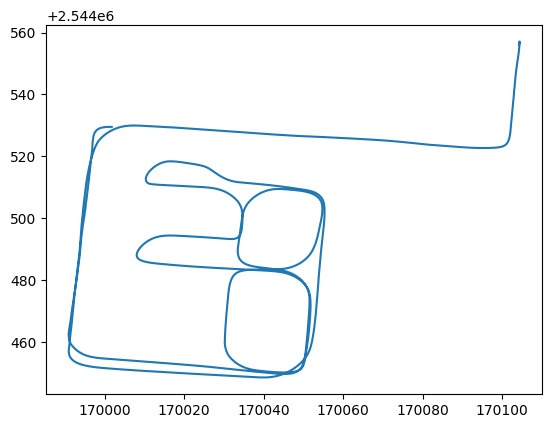

In [21]:
# check lidar trajectory
plt.plot(r_m2l[:, 0], r_m2l[:, 1])

Check lidar timestamp method

7.368799850179797e-05

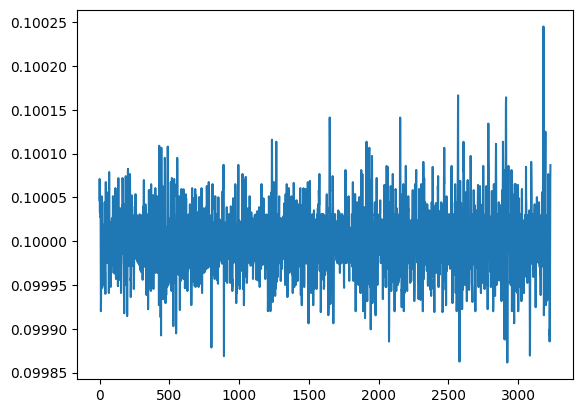

In [22]:
# # check lidar rpm 
plt.plot(lidar_sow[1:-1]-lidar_sow[0:-2])
np.sum( (lidar_sow[1:-1]-lidar_sow[0:-2]) - 0.1 )

Traversal the Lidar frame retrieve the X,Y,Z with min-max range


In [23]:
# Import libraries
import glob
import pandas as pd

# Get CSV files list from a folder
pointcloud_files = glob.glob(pcap_frame_file + "/*.txt")


In [37]:
# for i in range(len(pointcloud_files)):
df = pd.read_csv(pointcloud_files[i])
XYZ = df.iloc[:,1:4].to_numpy()


In [38]:
# cloud[0] means the first frame of scanned point cloud,
# [0:3] means we only want to get x,y,z without intensity, ring, time
# .T means transpose the matrix direction
# print(cloud[0][:,0:3].T)

change the cloud shape in those 2 options:
```python=
cloud[0][:, 0:3].T
cloud[0][:, 0:3].reshape(3, -1)
```


In [ ]:
# cloud[0] means the first frame of scanned point cloud,
# [0:3] means we only want to get x,y,z without intensity, ring, time
# .T means transpose the matrix direction
test = cloud[0][:, 0:3].T
print(test)
print(np.shape(test))

Rigid3D (Rotation matrix , translation vector) Lidar to mapping frame



In [ ]:
def homogeneousForm(RotationMatrix, TransVector):
    # a stands for (0, 0, 0) add on the bottom of the Rotation matrix
    a = np.concatenate((RotationMatrix, np.zeros((1, 3))), axis=0)
    # b stands for (1) add on the bottom of translation vector
    b = np.concatenate((TransVector, np.ones((1,1)) ), axis=0)
    # Combine a and b => becoming a 4*4 matrix
    Transformation= np.concatenate((a, b), axis=1)
    return Transformation

In [ ]:
# decode the point cloud under lidar frame 
r_m2p = list(range(len(cloud)))

for i in range(len(cloud)):
    # rotation matrix from body frame to mapping frame 3*3
    R_m2b = eulXYZ2rotmENU(lidar_att[i, :])
    # point cloud data transform to 3*1
    cloud_xyz = cloud[i][:, 0:3].T
    # rotation matrix from lidar frame to mapping frame 3*3
    R_m2l = (R_m2b @ R_b2l)
    # translation vector from lidar frame to mapping frame 3*1
    vector = r_m2l[i, :].reshape(3, 1)
    # create a homogeneous form by function 4*4
    Transformation = homogeneousForm(R_m2l, vector)
    # create a homogeneous point cloud vector 4*n
    cloud_xyz1 = np.concatenate((cloud_xyz, np.ones((1, cloud_xyz.shape[1]))), axis=0)
    # output: remove all the bottom 1 and get each lidar frame point cloud in mapping frame 4*n
    r_m2p[i] = (Transformation @ cloud_xyz1)[0:3, :].T


# print(r_m2p.shape())

Save the DG output

In [ ]:
# Call the function to create the output file path
output_file = create_output_file_with_area(input_file, output_folder, area)

print(f"Input File: {input_file}")
print(f"Output File: {output_file}")

In [ ]:
# save the AFTER DG frame
with open(output_file,'w') as f:
    writer = csv.writer(f, delimiter='\t',lineterminator='\n',)
# range(start, end, skip_value) = (first frame, last frame, every ? frame)
    for i in range(0, len(r_m2p), 10):
        # r_m2p[i] means in which frame of point cloud?
        ptcloud = r_m2p[i]
        for row in ptcloud:
            writer.writerow(row)

In [ ]:
def write_pcd_header(output_file):
    header = """\
    # .PCD v0.7 - Point Cloud Data file format
    VERSION 0.7
    FIELDS x y z intensity
    SIZE 4 4 4 4
    TYPE F F F F
    COUNT 1 1 1 1
    WIDTH 0
    HEIGHT 1
    VIEWPOINT 0 0 0 1 0 0 0
    POINTS 0
    DATA ascii
    """

    with open(output_file, 'w') as file:
        file.write(header)


# Call the function to write the PCD header
write_pcd_header(output_file)
